# Import Libraries

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go


# Read Data

In [34]:
excel_data =  pd.ExcelFile(r"E:\cources\NTI data analysis\Final Project\Chinook.xlsx")

In [35]:
sheet_names = excel_data.sheet_names
sheet_names


['Sheet1',
 'All_Data',
 'FactInvoice',
 'DimCustomer',
 'DimEmployee',
 'DimTrack',
 'DimArtist',
 'DimAlbum',
 'DimDate',
 'Sheet2']

# EDA

In [36]:
fact_invoice = excel_data.parse('FactInvoice')
dim_customer = excel_data.parse('DimCustomer')
dim_employee = excel_data.parse('DimEmployee')
dim_track = excel_data.parse('DimTrack')
dim_artist = excel_data.parse('DimArtist')
dim_album = excel_data.parse('DimAlbum')
dim_date = excel_data.parse('DimDate')

In [37]:
sheets = {
    'FactInvoice': fact_invoice,
    'DimCustomer': dim_customer,
    'DimEmployee': dim_employee,
    'DimTrack': dim_track,
    'DimArtist': dim_artist,
    'DimAlbum': dim_album,
    'DimDate': dim_date
}

In [38]:
fact_invoice.head()

,Invoice_Id,Invoice_Date,Unit_Price,Line_Total,Quantity,Genre,Media_Type,Track_Id,InvoiceLine_Id,Album_Id,Customer_Id,Artist_Id,Emp_Id
0,89,2022-01-18,0.99,0.99,1,Rock,MPEG audio file,2928,483,232,7,150,5
1,89,2022-01-18,0.99,0.99,1,Rock,MPEG audio file,2937,484,232,7,150,5
2,89,2022-01-18,0.99,0.99,1,Rock,MPEG audio file,2946,485,233,7,150,5
3,89,2022-01-18,0.99,0.99,1,Rock,MPEG audio file,2955,486,234,7,150,5
4,89,2022-01-18,0.99,0.99,1,Rock,MPEG audio file,2964,487,235,7,150,5


In [39]:
dim_employee.head()

,Emp_Id,Emp_Name,Emp_Title
0,3,Jane Peacock,Sales Support Agent
1,4,Margaret Park,Sales Support Agent
2,5,Steve Johnson,Sales Support Agent


In [40]:
dim_track.head()

,Track_Id,Track_Name,Composer,Duration in min,Size in mb
0,3,Fast As a Shark,"F. Baltes, S. Kaufman, U. Dirkscneider & W. Ho...",3.8,3.81
1,48,Not The Doctor,Alanis Morissette & Glenn Ballard,3.8,7.25
2,252,Samba Do Lado,Chico Science,3.8,7.19
3,304,Firmamento,Harry Lawes/Winston Foster-Vers,3.8,7.16
4,376,Vôo Sobre o Horizonte,J.r.Bertami/Parana,3.8,7.18


In [41]:
dim_album.head()

,Album_Id,Album_Title
0,1,For Those About To Rock We Salute You
1,2,Balls to the Wall
2,3,Restless and Wild
3,4,Let There Be Rock
4,5,Big Ones


In [42]:
dim_artist.head()

,Artist_Id,Artist_Name
0,1,AC/DC
1,2,Accept
2,3,Aerosmith
3,4,Alanis Morissette
4,5,Alice In Chains


In [43]:
dim_date.head()

,Invoice_Date,Year,Quarter,Month,Month Name,Day,Day Name
0,2021-01-01,2021,1,1,January,1,Friday
1,2021-01-02,2021,1,1,January,2,Saturday
2,2021-01-03,2021,1,1,January,3,Sunday
3,2021-01-06,2021,1,1,January,6,Wednesday
4,2021-01-11,2021,1,1,January,11,Monday


In [44]:
merged_data = pd.merge(fact_invoice, dim_customer, on='Customer_Id', how='left')

merged_data = pd.merge(merged_data, dim_employee, on='Emp_Id', how='left')

merged_data = pd.merge(merged_data, dim_track, on='Track_Id', how='left')

merged_data = pd.merge(merged_data, dim_album, on='Album_Id', how='left')

merged_data = pd.merge(merged_data, dim_artist, on='Artist_Id', how='left')

merged_data = pd.merge(merged_data, dim_date, on='Invoice_Date', how='left')

## Explanation of the Merge Process

### 1. **Left Joins (`how='left'`)**
- This ensures that all records from the `FactInvoice` table are retained in the merged result, even if there is no matching entry in the other tables.
- The `left` join keeps all rows from the left DataFrame (`FactInvoice`), filling in missing values from the right DataFrame with `NaN` where no match is found.

### 2. **Sequential Merging**
- Each `merge()` operation progressively combines information from each dimension table (such as `Customer`, `Employee`, etc.) into the `FactInvoice` table.
- As each merge happens, new columns (e.g., customer details, employee details) are added to the `FactInvoice` table, enriching the data for analysis.

### 3. **Final Merged Data**
- The final `merged_data` DataFrame will contain all columns from the `FactInvoice` table along with the combined columns from each dimension table.
- This enables you to conduct a comprehensive analysis of the combined data, leveraging the enriched information from all invoexplanations!


In [45]:
music=merged_data.copy()

In [46]:
music.head().T

,0,1,2,3,4
Invoice_Id,89,89,89,89,89
Invoice_Date,2022-01-18 00:00:00,2022-01-18 00:00:00,2022-01-18 00:00:00,2022-01-18 00:00:00,2022-01-18 00:00:00
Unit_Price,0.99,0.99,0.99,0.99,0.99
Line_Total,0.99,0.99,0.99,0.99,0.99
Quantity,1,1,1,1,1
Genre,Rock,Rock,Rock,Rock,Rock
Media_Type,MPEG audio file,MPEG audio file,MPEG audio file,MPEG audio file,MPEG audio file
Track_Id,2928,2937,2946,2955,2964
InvoiceLine_Id,483,484,485,486,487
Album_Id,232,232,233,234,235


In [47]:
music.shape

(2240, 30)

In [48]:
music.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Invoice_Id       2240 non-null   int64         
 1   Invoice_Date     2240 non-null   datetime64[ns]
 2   Unit_Price       2240 non-null   float64       
 3   Line_Total       2240 non-null   float64       
 4   Quantity         2240 non-null   int64         
 5   Genre            2240 non-null   object        
 6   Media_Type       2240 non-null   object        
 7   Track_Id         2240 non-null   int64         
 8   InvoiceLine_Id   2240 non-null   int64         
 9   Album_Id         2240 non-null   int64         
 10  Customer_Id      2240 non-null   int64         
 11  Artist_Id        2240 non-null   int64         
 12  Emp_Id           2240 non-null   int64         
 13  Customer_Name    2240 non-null   object        
 14  Country          2240 non-null   object 

## Insights from the Data

- **Data Overview**:
  - 2240 entries, 30 columns with various data types (integers, floats, datetime, objects).
  - No missing values (clean dataset).

- **Key Columns**:
  - **Invoice Info**: `Invoice_Id`, `Invoice_Date`, `Quantity`, `Unit_Price`, `Line_Total`.
  - **Product Info**: `Genre`, `Media_Type`, `Track_Name`, `Album_Title`, `Artist_Name`.
  - **Customer Info**: `Customer_Id`, `Customer_Name`, `Country`, `City`.
  - **Employee Info**: `Emp_Id`, `Emp_Name`, `Emp_Title`.
  - **Time Info**: `Year`, `Quarter`, `Month`, `Month Name`, `Day`, customer segmentation.


In [49]:
music.describe(include='all').T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
Invoice_Id,2240.0,NaN,NaN,NaN,206.86875,1.0,103.0,207.0,311.0,412.0,119.134877
Invoice_Date,2240,NaN,NaN,NaN,2023-06-25 13:42:12.857142784,2021-01-01 00:00:00,2022-03-21 00:00:00,2023-06-24 00:00:00,2024-09-28 00:00:00,2025-12-22 00:00:00,NaN
Unit_Price,2240.0,NaN,NaN,NaN,1.039554,0.99,0.99,0.99,0.99,1.99,0.217069
Line_Total,2240.0,NaN,NaN,NaN,1.039554,0.99,0.99,0.99,0.99,1.99,0.217069
Quantity,2240.0,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,0.0
Genre,2240,24,Rock,835,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_Type,2240,5,MPEG audio file,1976,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Track_Id,2240.0,NaN,NaN,NaN,1717.734375,1.0,874.0,1708.0,2560.0,3500.0,993.797999
InvoiceLine_Id,2240.0,NaN,NaN,NaN,1120.5,1.0,560.75,1120.5,1680.25,2240.0,646.776623
Album_Id,2240.0,NaN,NaN,NaN,138.558482,1.0,70.0,141.0,206.25,344.0,80.752497


## Insights from Summary Statistics

- **Invoice Info**:
  - **Invoice_Id**: Range from 1 to .87.
  - **Invoice_Date**: The data spans from 2021-01-01 to 2025-12-22, with a peak around 2023-06-25.
  
- **Pricing and Quantity**:
  - **Unit_Price**: Prices range from 0.99 to 1.99, with a mean of 1.04.
  - **Line_Total**: Same range as `Unit_Price`, indicating consistent pricing across records.
  - **Quantity**: All entries have a quantity of 1, suggesting single-item purchases.

- **Product Information**:
  - **Genre**: 24 unique genres; the most common is 'Rock' (835 occurrences).
  - **Media_Type**: Predominantly 'MPEG audio file' (1976 occurrences).
  - **Track_Name**: 1884 unique tracks; 'The Trooper' appears 5 times.
  - **Composer**: 622 unique composers; 'Steve Harris' appears 58 times.

- **Customer and Location**:
  ges 29.97, with a range from 15 to 59.
  - **Customer_Name**: 59 unique customers; 'Astrid Gruber' is the most frequent (38 occurrences).
  - **Country**: 24 unique countries; 'USA' is the most common (494 occurrences).
  - **City**: 53 unique cities; 'Berlin' appears 76 times.

- **Employee Informat**: Averages 3.95, with values ranging from 3 to 5.
  - **Emp_Name**: Only 3 unique employees, with 'Jane Peacock' being the most frequent (796 occurrences).
  - **Emp_Title**: The title 'Sales Support Agent' appears 2240 times, indicating it applies to all employees.

- **Album and Artist Info**:
  - **Album_Title**: 304 unique albums, with 'Minha Historia' appearing 27 times.
  - **Artist_Name**: 165 unique artists, with 'Iron Maiden' being the most frequent (140 occurrences).

- **Time Data**:
  - **Year*. to 2025, with a mean of 2022.99.
  - **Quarter**: Averages around 2.5, indicating sales across all quarters.
  - **Month**: Sales are spread across months, with he most common day (324 occurrences).

- **File Size & Duration**:
  - **Duration i..1 minutes, with a mean of 6.26 minutes.
  - **Size .B to 1010.46 MB, with a mean of 28.59 MB.

### Key Takeaways:
- The dataset primarily deals with music-related sales (invoices, tracks, albums, and artists).
- Most customers purchase a single item at a time, with consistent pricing.
- Employee information is very centralized, with a small number of employees working across all records.
- Sales are spread across various times (quarters, months), with a concentration around mid-year and Sundays.


In [50]:
music.nunique()

Invoice_Id          412
Invoice_Date        354
Unit_Price            2
Line_Total            2
Quantity              1
Genre                24
Media_Type            5
Track_Id           1984
InvoiceLine_Id     2240
Album_Id            304
Customer_Id          59
Artist_Id           165
Emp_Id                3
Customer_Name        59
Country              24
City                 53
Emp_Name              3
Emp_Title             1
Track_Name         1884
Composer            622
Duration in min     162
Size in mb         1003
Album_Title         304
Artist_Name         165
Year                  5
Quarter               4
Month                12
Month Name           12
Day                  31
Day Name              7
dtype: int64

In [51]:
columns = ['Unit_Price', 'Quantity', 'Genre', 'Media_Type', 'Country', 'City', 'Emp_Name', 'Emp_Title', 'Year']

for col in columns:
    print(f"Value counts for '{col}':")
    print(music[col].value_counts())
    print("\n" + "-" * 40 + "\n")


Value counts for 'Unit_Price':
Unit_Price
0.99    2129
1.99     111
Name: count, dtype: int64

----------------------------------------

Value counts for 'Quantity':
Quantity
1    2240
Name: count, dtype: int64

----------------------------------------

Value counts for 'Genre':
Genre
Rock                  835
Latin                 386
Metal                 264
Alternative & Punk    244
Jazz                   80
Blues                  61
TV Shows               47
Classical              41
R&B/Soul               41
Reggae                 30
Drama                  29
Pop                    28
Soundtrack             20
Sci Fi & Fantasy       20
Hip Hop/Rap            17
Bossa Nova             15
Alternative            14
World                  13
Heavy Metal            12
Electronica/Dance      12
Easy Listening         10
Comedy                  9
Science Fiction         6
Rock And Roll           6
Name: count, dtype: int64

----------------------------------------

Value counts for 'Med

In [52]:
corr = music[['Unit_Price', 'Line_Total','Duration in min', 'Size in mb', 'Year']].corr()
corr


,Unit_Price,Line_Total,Duration in min,Size in mb,Year
Unit_Price,1.000000,1.000000,0.933522,0.944402,0.045915
Line_Total,1.000000,1.000000,0.933522,0.944402,0.045915
Duration in min,0.933522,0.933522,1.000000,0.966231,0.036468
Size in mb,0.944402,0.944402,0.966231,1.000000,0.036725
Year,0.045915,0.045915,0.036468,0.036725,1.000000


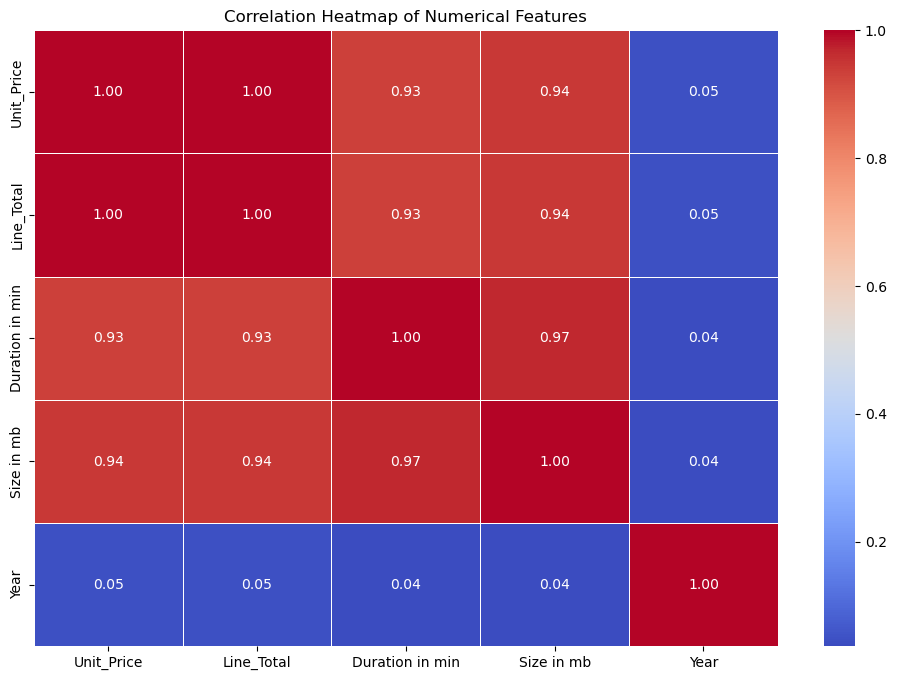

In [53]:
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()


In [54]:
from ydata_profiling import ProfileReport

profile = ProfileReport(music)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing 

In [55]:
music.isnull().sum().sum()

0

In [56]:
music.duplicated().sum()

0

In [57]:
music['Duration_Category'] = pd.cut(music['Duration in min'],
                                     bins=[0, 3, 5, 10, np.inf],
                                       labels=['Short', 'Medium', 'Long', 'Very Long'])
music['Duration_Category'].value_counts()

Duration_Category
Medium       1231
Long          527
Short         345
Very Long     137
Name: count, dtype: int64

# Analysis and Visualization

### Sales by Month (Line Chart)

In [58]:
sales = music.groupby(['Month'])['Line_Total'].sum().reset_index()
sales

,Month,Line_Total
0,1,201.12
1,2,187.20
2,3,195.10
3,4,198.14
4,5,193.10
5,6,201.10
6,7,190.10
7,8,198.10
8,9,196.20
9,10,193.10


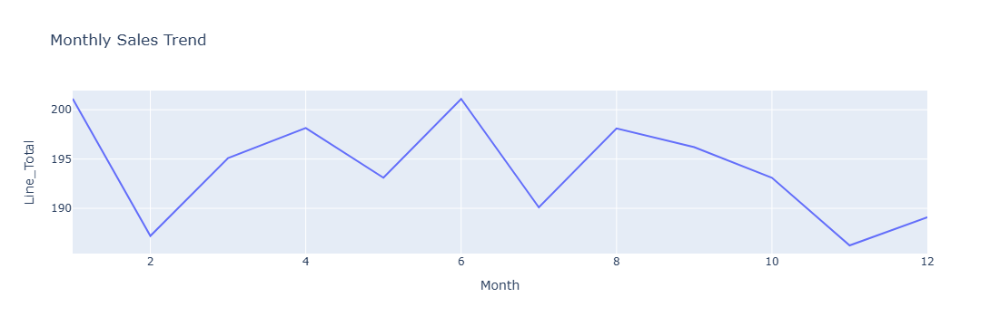

In [59]:
fig = px.line(sales, x='Month', y='Line_Total', title="Monthly Sales Trend")
fig.show()

### Genre Distribution 


In [60]:
genre_counts = music['Genre'].value_counts().reset_index()
genre_counts

,Genre,count
0,Rock,835
1,Latin,386
2,Metal,264
3,Alternative & Punk,244
4,Jazz,80
5,Blues,61
6,TV Shows,47
7,Classical,41
8,R&B/Soul,41
9,Reggae,30


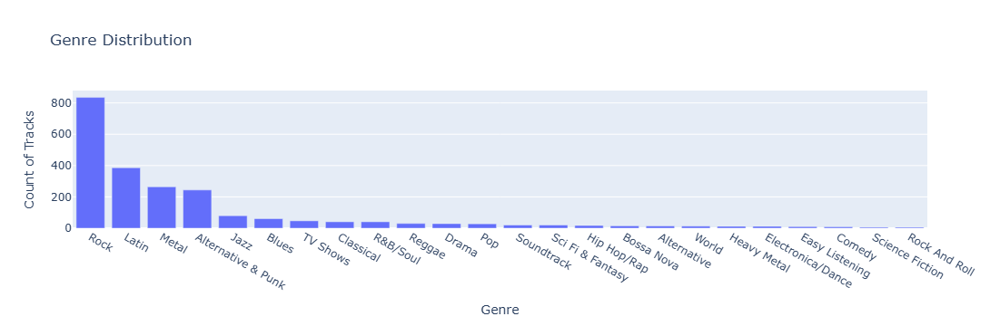

In [61]:

fig = px.bar(genre_counts, x='Genre', y='count', title="Genre Distribution", labels={'Count': 'Number of Tracks'})
fig.update_layout(xaxis_title="Genre", yaxis_title="Count of Tracks")
fig.show()

###  Media Type Popularity 

In [62]:
media_counts = music['Media_Type'].value_counts().reset_index()
media_counts

,Media_Type,count
0,MPEG audio file,1976
1,Protected AAC audio file,146
2,Protected MPEG-4 video file,111
3,Purchased AAC audio file,4
4,AAC audio file,3


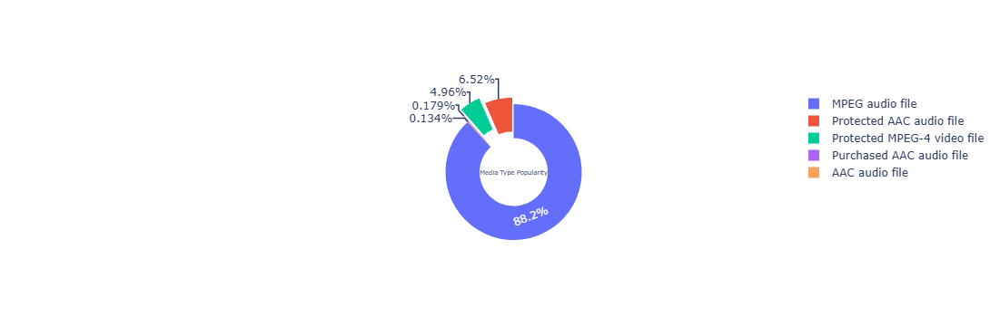

In [66]:
fig = go.Figure(
    go.Pie(
        labels=media_counts['Media_Type'],
        values=media_counts['count'],
        hole=0.5,
        title="Media Type Popularity",
        pull=[0.0, 0.1, 0.2, 0.1]  
    )
)
fig.show()

### Top 10 Countries by Track Count

In [67]:
country_track_counts = music.groupby('Country')['Track_Id'].nunique().nlargest(10).reset_index()
country_track_counts.columns = ['Country', '#Tracks']
country_track_counts

,Country,#Tracks
0,USA,486
1,Canada,302
2,Brazil,190
3,France,190
4,Germany,152
5,United Kingdom,114
6,Czech Republic,76
7,Portugal,76
8,India,74
9,Argentina,38


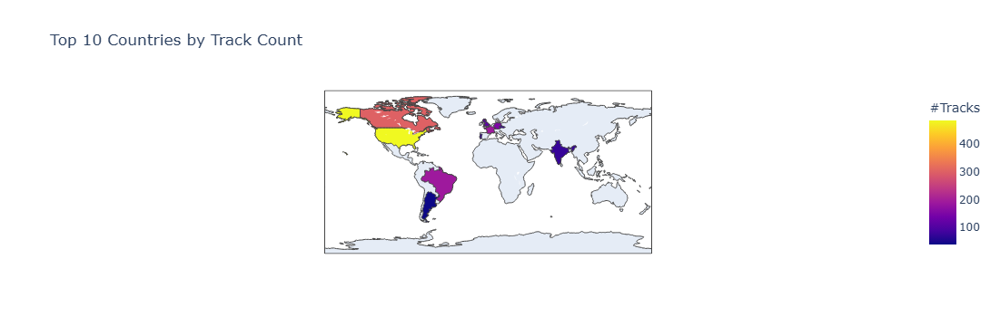

In [68]:
fig = px.choropleth(
    country_track_counts,
    locations='Country',
    locationmode='country names',
    color='#Tracks',
    title="Top 10 Countries by Track Count"
)
fig.show()

### Top 10 Artist by Track Count

In [69]:
artist_track_counts = music.groupby('Artist_Name')['Track_Id'].nunique().nlargest(10).reset_index()
artist_track_counts.columns = ['Artist_Name', '#Tracks']
artist_track_counts

,Artist_Name,#Tracks
0,Iron Maiden,123
1,U2,91
2,Metallica,79
3,Led Zeppelin,77
4,Deep Purple,41
5,Lost,40
6,Os Paralamas Do Sucesso,39
7,Faith No More,36
8,Eric Clapton,35
9,Queen,33


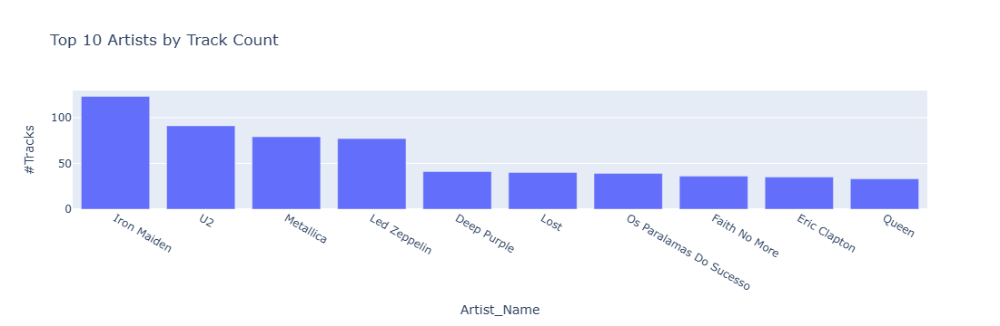

In [70]:
fig = px.bar(artist_track_counts, x='Artist_Name', y='#Tracks', title="Top 10 Artists by Track Count")
fig.show()


###  Average Track Length by Genre 

In [71]:
avg_duration_genre = music.groupby('Genre')['Duration in min'].mean().reset_index()

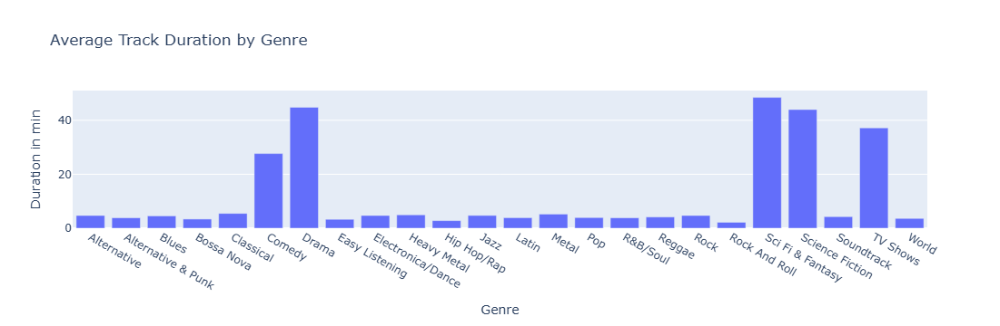

In [72]:
fig = px.bar(avg_duration_genre, x='Genre', y='Duration in min', title="Average Track Duration by Genre")
fig.show()

### distribution of the Duration_Category

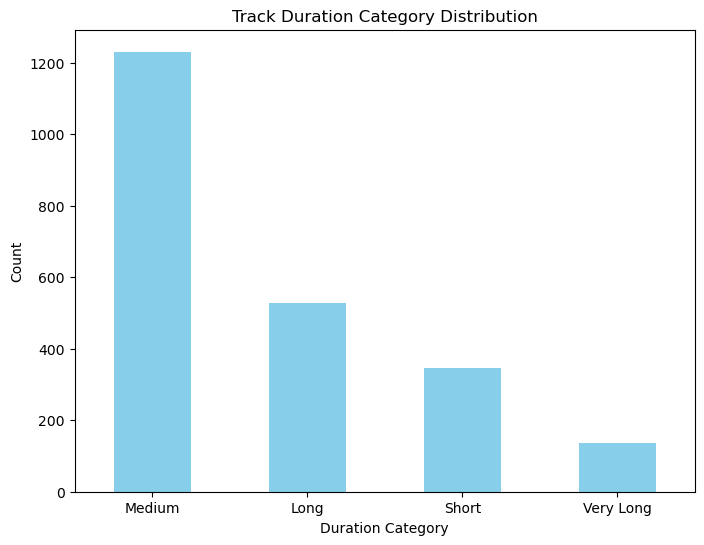

In [73]:
duration_counts = music['Duration_Category'].value_counts()

plt.figure(figsize=(8, 6))
duration_counts.plot(kind='bar', color='skyblue')

plt.title('Track Duration Category Distribution')
plt.xlabel('Duration Category')
plt.ylabel('Count')
plt.xticks(rotation=0)  
plt.show()


###  Track Size vs. Duration 

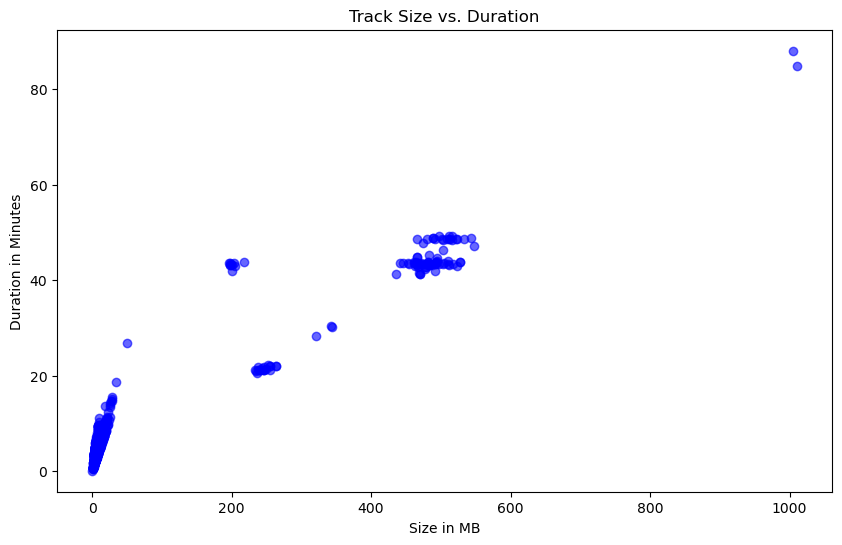

In [74]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(music['Size in mb'], music['Duration in min'], alpha=0.6, color='blue')

plt.title("Track Size vs. Duration")
plt.xlabel('Size in MB')
plt.ylabel('Duration in Minutes')

plt.show()


In [75]:
# pip install wordcloud matplotlib

### Generating the Word Cloud for Album Title


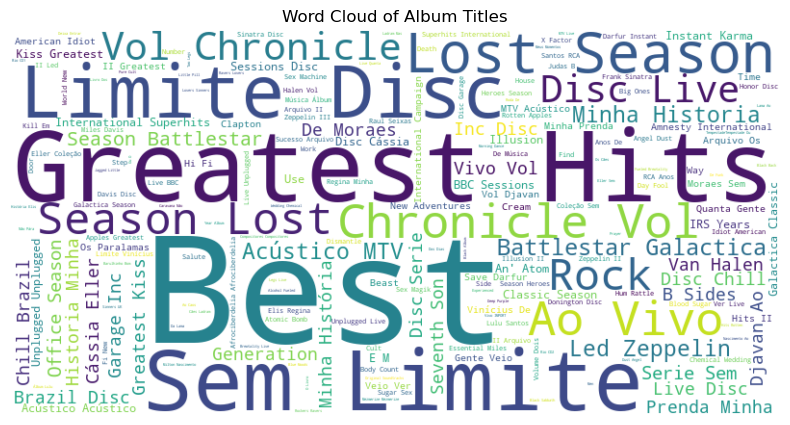

In [76]:
from wordcloud import WordCloud

all_titles = ' '.join(music['Album_Title'].dropna().astype(str))

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(all_titles)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Album Titles')
plt.show()